# Show results of a specific model

In [1]:
# TO_COMPARE = ["2022_03_27-20_51_13", "2022_03_27-20_51_29", "2022_03_27-20_51_43"] # lr from scratch
# TO_COMPARE = ["2022_03_28-02_01_58","2022_03_28-02_02_28","2022_03_28-02_02_38","2022_03_28-02_02_43","2022_03_28-18_15_16"] # lr
TO_COMPARE = ["2022_03_28-18_15_38","2022_03_28-18_23_16","2022_03_29-04_12_27","2022_03_29-04_14_51"] # bs

NB_IMAGES = 20

BATCH_SIZE=5

WIDTH = 8
HEIGHT = 8

In [2]:
def get_name(row):
    # return f"{row['run_id']} on {row['epochs_trained_nb']} with lr {row['training_gen_lr']}" # lr
    return f"{row['run_id']} on {row['epochs_trained_nb']} with batch size {row['training_batch_size']}" # bs

In [3]:
%cd ..

/Users/antoinestutz/Documents/Cours/Deepl/Projet/cartoongan


In [4]:
import os
import pandas as pd
from ast import literal_eval
from math import ceil

from src.pipelines.cartoonizer import Cartoonizer
from src import models, dataset, preprocessing, config
from src.models.utils.parameters import Architecture
import matplotlib.pyplot as plt

In [5]:
def get_cartoonizer(df_runs, run_id):
    run = df_runs.loc[df_runs['run_id'] == run_id].iloc[0]
    gen_path = os.path.join(
        config.WEIGHTS_FOLDER,
        run["run_id"],
        f"trained_gen_{run['epochs_trained_nb']}.pkl",
    )
    architecture_dict = {
        "Style Gan": Architecture.GANStyle,
        "UNet GAN": Architecture.GANUNet,
        "Fixed GAN": Architecture.GANFixed,
        "Modular GAN": Architecture.GANModular,
        "Anime GAN": Architecture.GANAnime,
    }
    crop_mode_dict = {
        "RESIZE": preprocessing.CropMode.RESIZE,
        "CROP_CENTER": preprocessing.CropMode.CROP_CENTER,
        "CROP_RANDOM": preprocessing.CropMode.CROP_RANDOM,
    }
    ratio_filter_dict = {
        "NO_FILTER": preprocessing.RatioFilterMode.NO_FILTER,
        "FILTER_PORTRAIT": preprocessing.RatioFilterMode.FILTER_PORTRAIT,
        "FILTER_LANDSCAPE": preprocessing.RatioFilterMode.FILTER_LANDSCAPE,
    }

    pictures_dataset_parameters = dataset.PicturesDatasetParameters(
        new_size=literal_eval(run["picture_dataset_new_size"]),
        crop_mode=crop_mode_dict[run["picture_dataset_crop_mode"]],
        ratio_filter_mode=ratio_filter_dict[run["picture_dataset_ratio_filter_mode"]],
        nb_images=NB_IMAGES,
    )

    cartoonizer = Cartoonizer(
        infering_parameters=models.InferingParams(batch_size=BATCH_SIZE),
        architecture=architecture_dict[run["cartoon_gan_architecture"]],
        architecture_params=models.ArchitectureParamsNULL(),
        pictures_dataset_parameters=pictures_dataset_parameters,
        gen_path=gen_path,
    )

    return get_name(run), cartoonizer

In [6]:
def get_path(df_runs, run_id):
    run = df_runs.loc[df_runs['run_id'] == run_id].iloc[0]
    pictures_path = os.path.join(config.LOGS_FOLDER, run_id, "pictures")
    epoch_pictures_path = os.path.join(
        pictures_path, f"epoch_{run['epochs_trained_nb']}"
    )
    return {"name": get_name(run), "path": epoch_pictures_path}

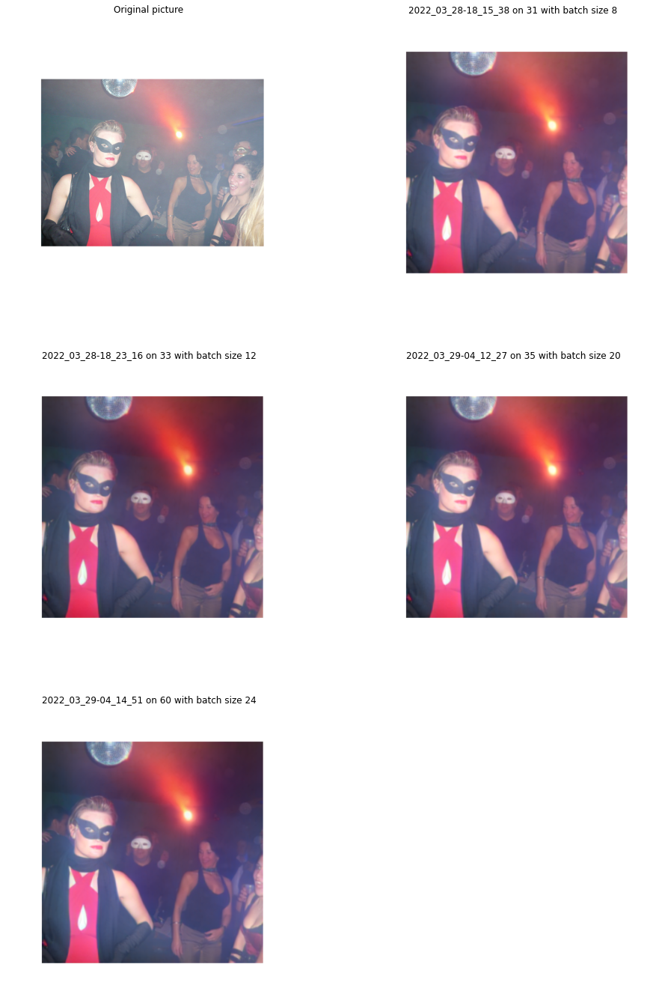

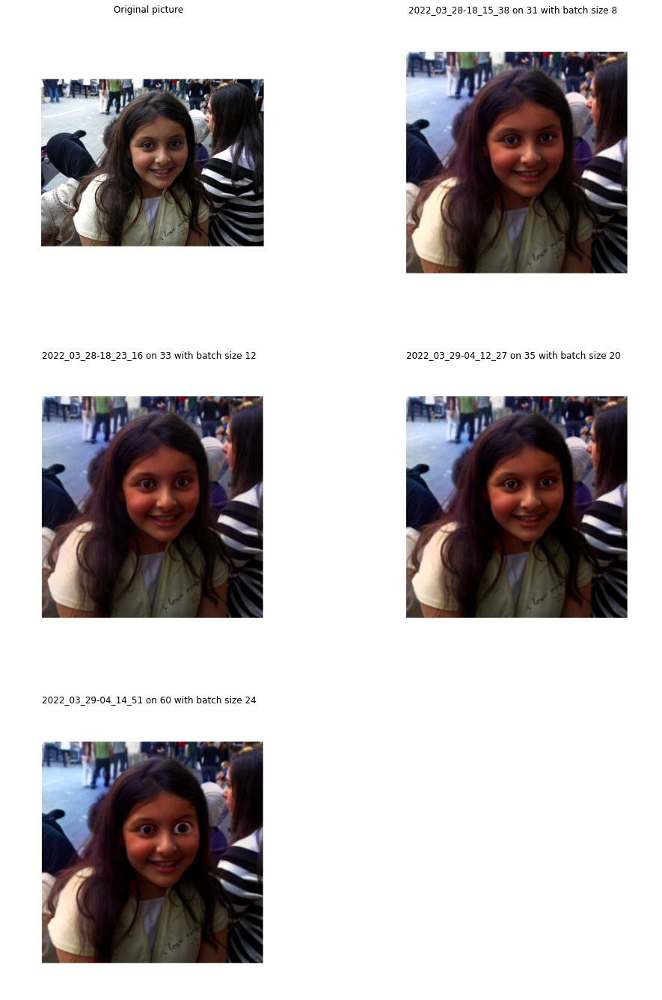

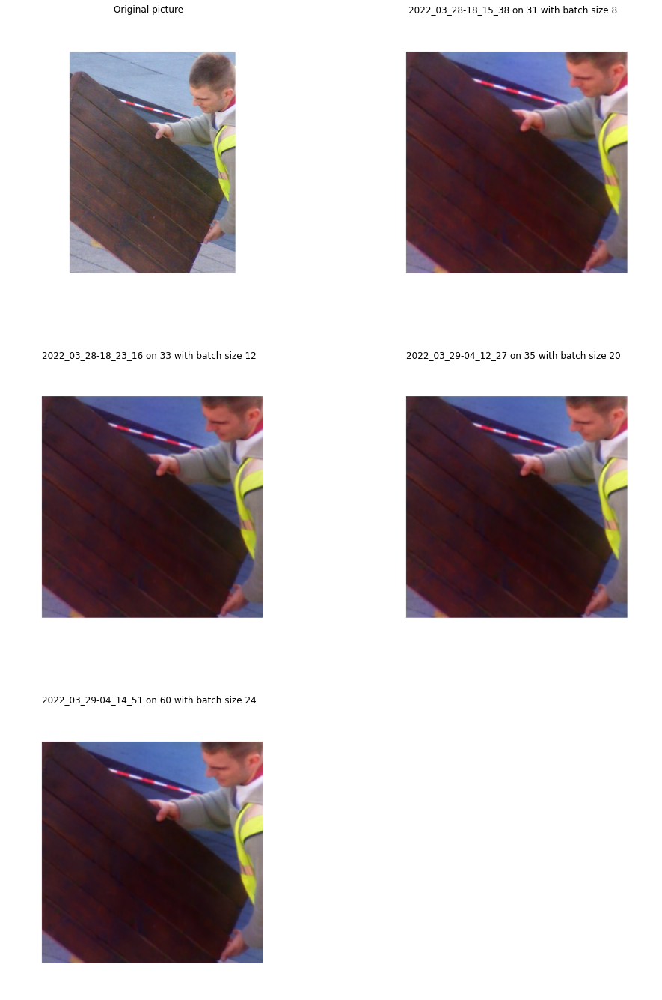

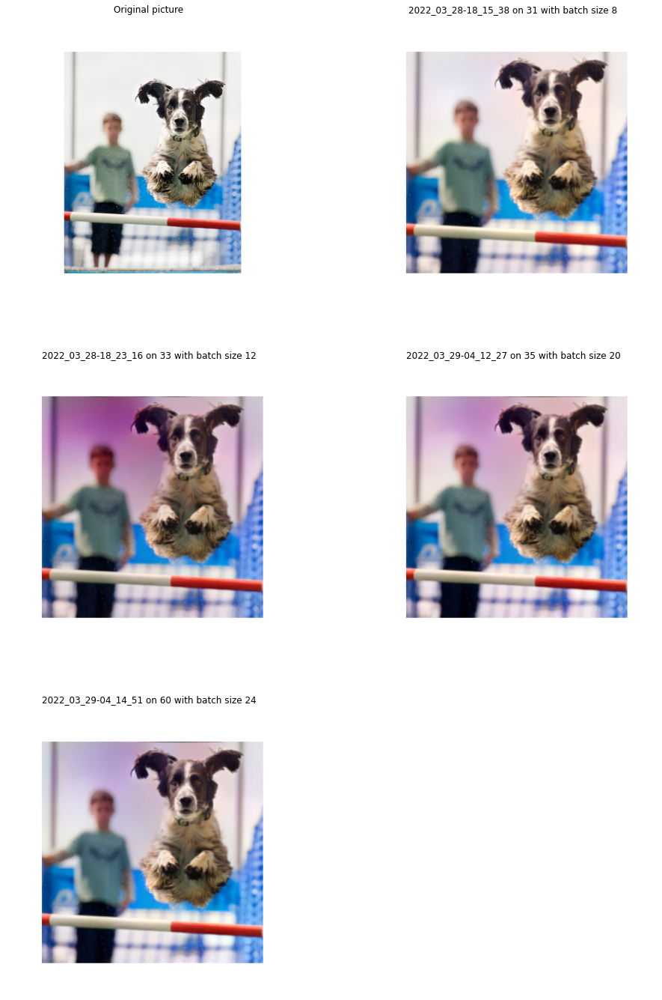

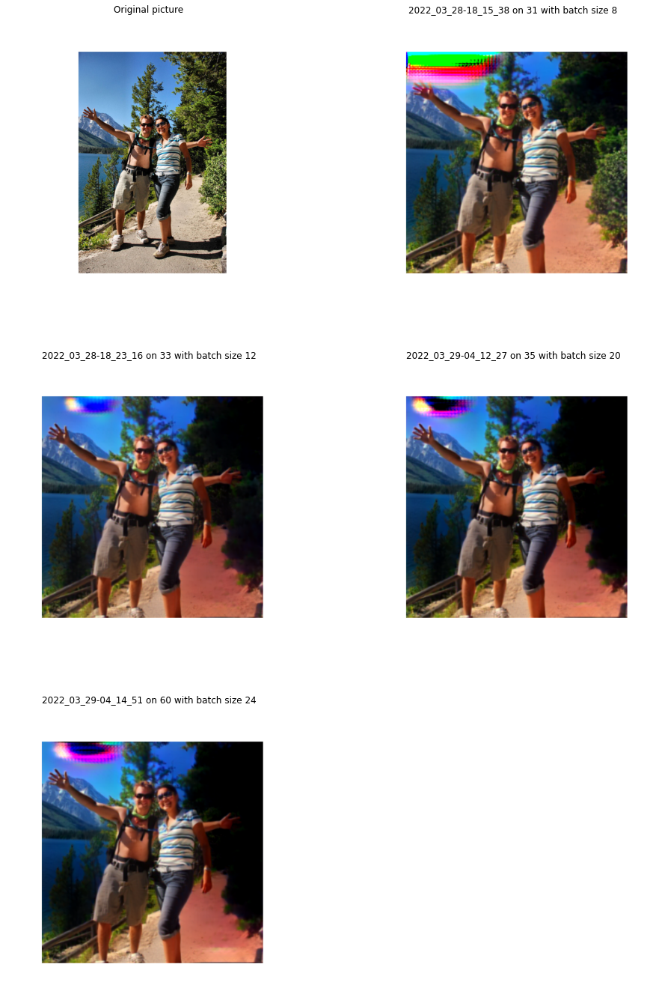

...

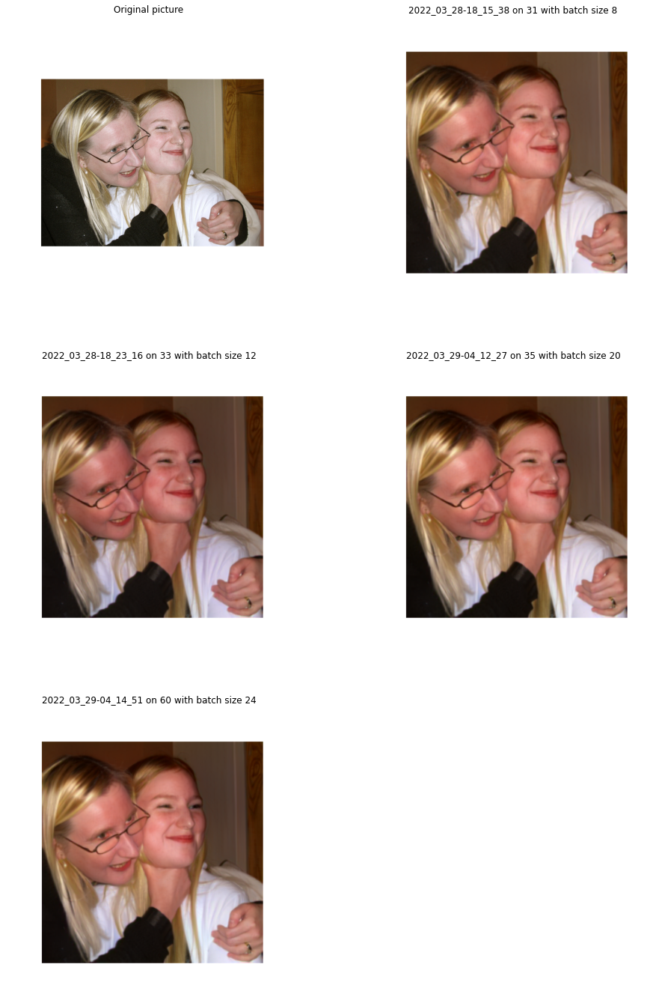

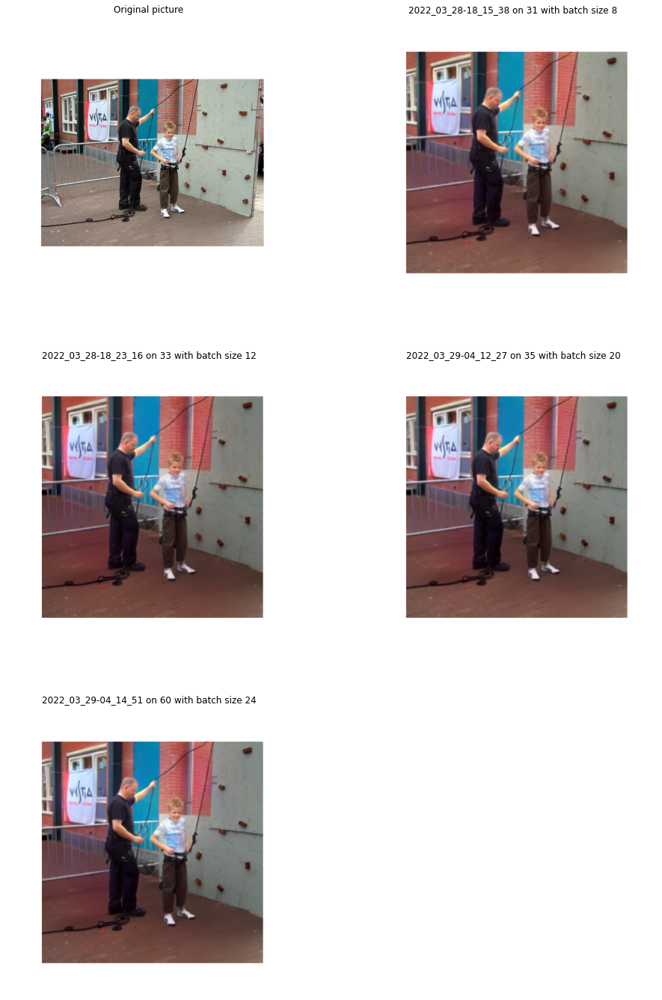

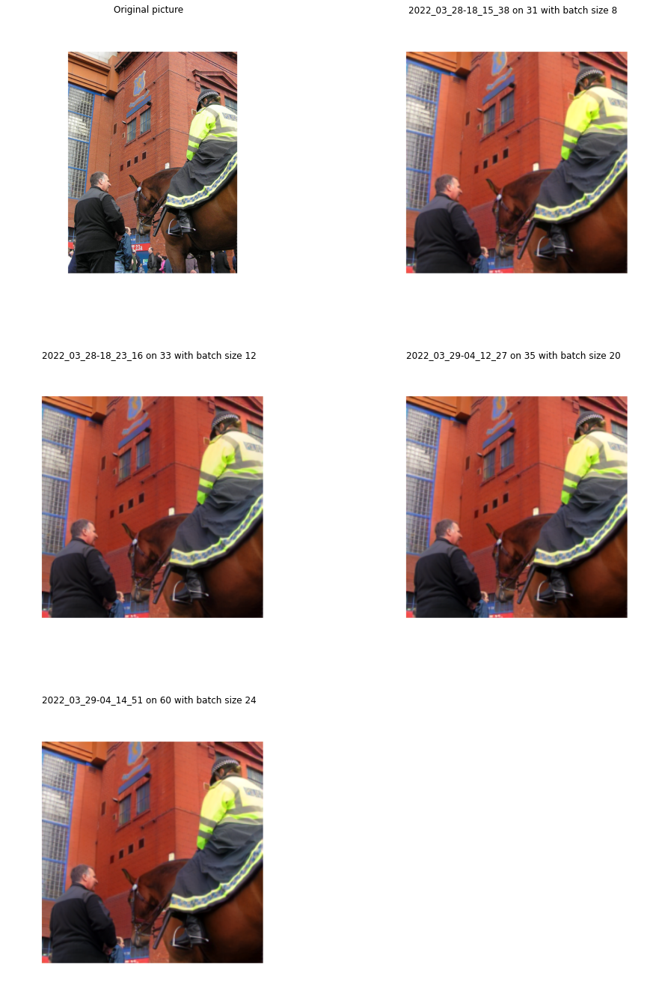

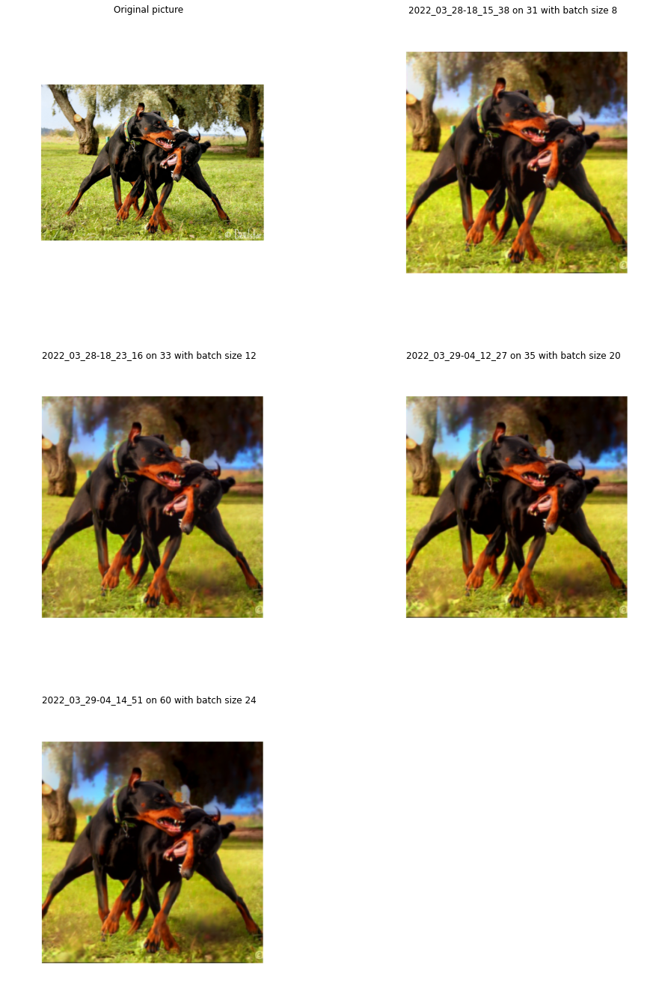

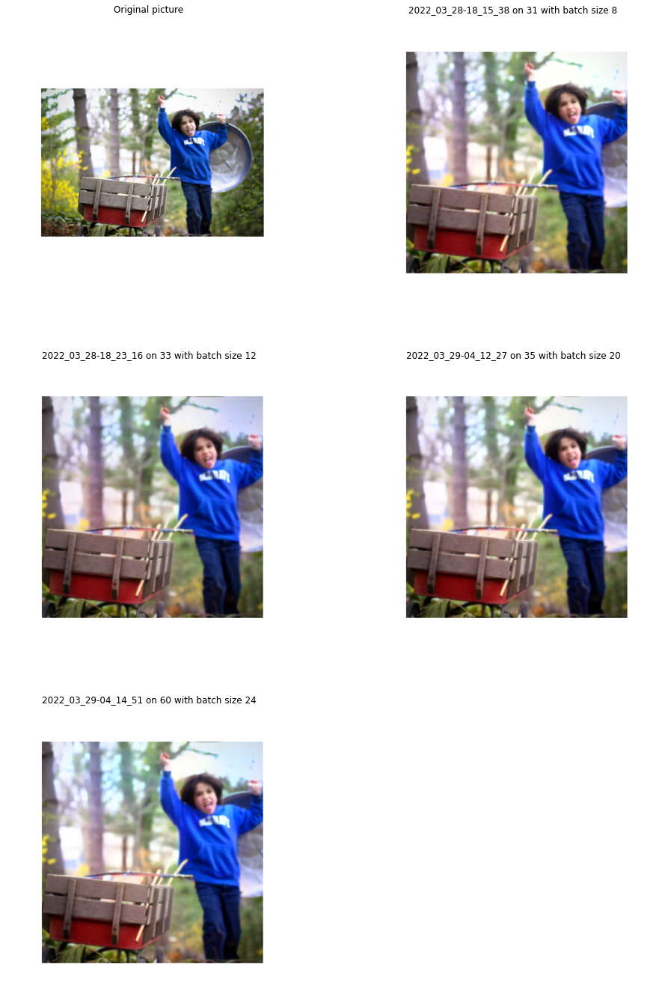

In [7]:
df_runs = pd.read_csv(config.REMOTE_PARAMS_PATH, index_col=0)
all_paths = {run_id: get_path(df_runs, run_id) for run_id in TO_COMPARE}

for i in range(NB_IMAGES):
    nb_models = len(TO_COMPARE)
    cols = 2
    rows = ceil((nb_models+1)/cols)
    fig = plt.figure(figsize=(WIDTH*cols, HEIGHT*rows))
    picture = plt.imread(f"{all_paths[TO_COMPARE[0]]['path']}/image_{i}_picture.png")
    ax = fig.add_subplot(rows, cols, 1)
    ax.axis("off")
    ax.imshow(picture)
    plt.title("Original picture")
    for j in range(len(TO_COMPARE)):
        run_id = TO_COMPARE[j]
        cartoon = plt.imread(f"{all_paths[run_id]['path']}/image_{i}_cartoon.png")
        ax = fig.add_subplot(rows, cols, j+2)
        ax.imshow(cartoon)
        plt.title(all_paths[run_id]['name'])
        ax.axis("off")